In [0]:
import tensorflow as tf
import numpy as np
import pickle
import matplotlib.pyplot as plt
from scipy.io import loadmat
%matplotlib inline

In [0]:
# # Install a Drive FUSE wrapper.
# # https://github.com/astrada/google-drive-ocamlfuse
# !apt-get install -y -qq software-properties-common python-software-properties module-init-tools
# !add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
# !apt-get update -qq 2>&1 > /dev/null
# !apt-get -y install -qq google-drive-ocamlfuse fuse



# # Generate auth tokens for Colab
# from google.colab import auth
# auth.authenticate_user()


# # Generate creds for the Drive FUSE library.
# from oauth2client.client import GoogleCredentials
# creds = GoogleCredentials.get_application_default()
# import getpass
# !google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
# vcode = getpass.getpass()
# !echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}


# # Create a directory and mount Google Drive using that directory.
# !mkdir -p My Drive
# !google-drive-ocamlfuse My Drive


# !ls Drive/

# # Create a file in Drive.
# !echo "This newly created file will appear in your Drive file list." > My Drive/created.txt

In [3]:
!ls Drive

CelebA			     FACES_TEST			   thresh_test.tar.gz
Colab Notebooks		     FACES_TRAIN		   Untitled0.ipynb
DATA_TEST		     GA_face_recognition_v2 2.zip  Untitled1.ipynb
DATA_TRAIN		     GA_face_recognition_v2.zip    Untitled2.ipynb
DCGAN-face-creation.ipynb    puneet_samples.pkl
DCGAN_face_generation.ipynb  StarGAN


In [0]:
folder_train = 'Drive/FACES_TRAIN/'
folder_test = 'Drive/FACES_TEST/'

In [0]:
# import cv2
# import os

# def load_images_from_folder(folder):
#     images = np.array([])
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder,filename))
#         if img is not None:
#             images = np.append(images, img)
#     return images

In [0]:
from skimage import io

trainset = io.imread_collection(folder_train + '*.jpg')
testset = io.imread_collection(folder_test + '*.jpg')

In [0]:
# trainset = load_images_from_folder(folder_train)
# testset = load_images_from_folder(folder_test)

In [8]:
print(np.shape(testset))
print(np.shape(trainset))

(433, 32, 32, 3)
(592, 32, 32, 3)


In [0]:
trainset = np.transpose(trainset, (1, 2, 3, 0))
testset = np.transpose(testset, (1, 2, 3, 0))

In [10]:
print(np.shape(testset))
print(np.shape(trainset))

(32, 32, 3, 433)
(32, 32, 3, 592)


In [0]:
# plt.imshow((trainset[:,:,:,6]))

In [0]:
# import matplotlib.image as mpimg
# img=mpimg.imread('Drive/DATA_TRAIN/resized20180629-134152-374823.png')
# imgplot=plt.imshow(img)
# plt.show()

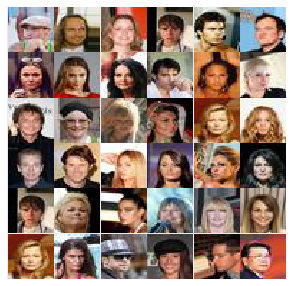

In [13]:
# Plot some images from dataset
idx = np.random.randint(0, trainset.shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset[:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

In [0]:
# Rescale the images to a range of -1 to 1, since the output of our generator is also in that range.
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min()) / (255 - x.min()))

    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [0]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test) * (1 - val_frac))
        self.test_x, self.valid_x = test[:, :, :, :split_idx], test[:, :, :, split_idx:]
        self.test_y, self.valid_y = test[:split_idx], test[split_idx:]
        self.train_x, self.train_y = train, train

        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)

        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle

    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]

        n_batches = len(self.train_y) // batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii + batch_size]
            y = self.train_y[ii:ii + batch_size]

            yield self.scaler(x), y

In [0]:
# Model inputs; inputs_real is discriminator input and inputs_z is generator input
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')

    return inputs_real, inputs_z

In [0]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope("generator", reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha*x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha*x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding="same")
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha*x3, x3)
        # 16x16x128 now
        
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding="same")
        # 32x32x3
        out = tf.tanh(logits)

        return out

In [0]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope("discriminator", reuse=reuse):
        # Input is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding="same")
        x1 = tf.maximum(alpha*x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding="same")
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)
        # 4x4x256

        # Flatten
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits

In [0]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    smooth = 0.1
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

In [0]:
def model_opt(d_loss, g_loss, learning_rate_d, learning_rate_g, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate_d, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate_g, beta1=beta1).minimize(g_loss, var_list=g_vars)
#         d_train_opt = tf.train.RMSPropOptimizer(learning_rate=2e-4).minimize(d_loss, var_list=d_vars)
#         g_train_opt = tf.train.RMSPropOptimizer(learning_rate=2e-4).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

In [0]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate_d, learning_rate_g, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()

        self.input_real, self.input_z = model_inputs(real_size, z_size)

        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)

        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate_d, learning_rate_g, beta1)

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5, 5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols,
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min()) * 255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')

    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

Epoch 50/30000... Discriminator Loss: 0.6346... Generator Loss: 3.6180
Epoch 100/30000... Discriminator Loss: 1.2284... Generator Loss: 1.0278
Epoch 150/30000... Discriminator Loss: 1.1732... Generator Loss: 0.9928
Epoch 200/30000... Discriminator Loss: 1.0670... Generator Loss: 0.9760
Epoch 250/30000... Discriminator Loss: 0.9917... Generator Loss: 1.0097
Epoch 300/30000... Discriminator Loss: 0.8372... Generator Loss: 1.3149
Epoch 350/30000... Discriminator Loss: 0.9194... Generator Loss: 2.3777
Epoch 400/30000... Discriminator Loss: 0.6814... Generator Loss: 1.5923
Epoch 450/30000... Discriminator Loss: 0.8082... Generator Loss: 1.1692
Epoch 500/30000... Discriminator Loss: 0.5710... Generator Loss: 1.8226


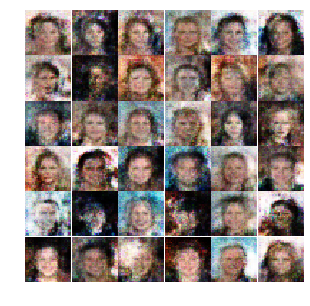

Epoch 550/30000... Discriminator Loss: 0.5355... Generator Loss: 1.8153
Epoch 600/30000... Discriminator Loss: 0.7522... Generator Loss: 3.5132
Epoch 650/30000... Discriminator Loss: 0.4577... Generator Loss: 2.5140
Epoch 700/30000... Discriminator Loss: 0.4544... Generator Loss: 2.4812
Epoch 750/30000... Discriminator Loss: 0.4675... Generator Loss: 2.3776
Epoch 800/30000... Discriminator Loss: 0.4145... Generator Loss: 2.7012
Epoch 850/30000... Discriminator Loss: 0.4063... Generator Loss: 2.7489
Epoch 900/30000... Discriminator Loss: 0.7958... Generator Loss: 1.1891
Epoch 950/30000... Discriminator Loss: 0.4113... Generator Loss: 2.7528
Epoch 1000/30000... Discriminator Loss: 0.3904... Generator Loss: 3.0512


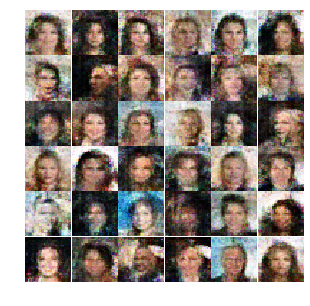

Epoch 1050/30000... Discriminator Loss: 0.3826... Generator Loss: 3.2282
Epoch 1100/30000... Discriminator Loss: 0.3743... Generator Loss: 3.3895
Epoch 1150/30000... Discriminator Loss: 0.3752... Generator Loss: 3.2021
Epoch 1200/30000... Discriminator Loss: 0.3645... Generator Loss: 3.5492
Epoch 1250/30000... Discriminator Loss: 0.4940... Generator Loss: 2.2507
Epoch 1300/30000... Discriminator Loss: 0.3880... Generator Loss: 3.1188
Epoch 1350/30000... Discriminator Loss: 0.3722... Generator Loss: 3.3817
Epoch 1400/30000... Discriminator Loss: 0.3541... Generator Loss: 3.8358
Epoch 1450/30000... Discriminator Loss: 0.3491... Generator Loss: 4.0726
Epoch 1500/30000... Discriminator Loss: 0.3498... Generator Loss: 4.0311


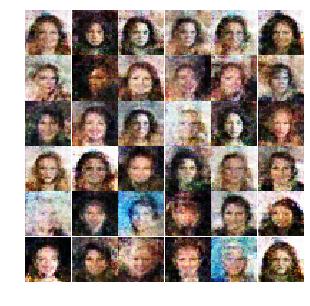

Epoch 1550/30000... Discriminator Loss: 0.3647... Generator Loss: 3.5222
Epoch 1600/30000... Discriminator Loss: 0.3445... Generator Loss: 4.4528
Epoch 1650/30000... Discriminator Loss: 0.3458... Generator Loss: 4.2535
Epoch 1700/30000... Discriminator Loss: 0.3523... Generator Loss: 4.7780
Epoch 1750/30000... Discriminator Loss: 0.3924... Generator Loss: 3.0171
Epoch 1800/30000... Discriminator Loss: 0.3592... Generator Loss: 3.7380
Epoch 1850/30000... Discriminator Loss: 0.3527... Generator Loss: 4.0180
Epoch 1900/30000... Discriminator Loss: 0.3474... Generator Loss: 4.0221
Epoch 1950/30000... Discriminator Loss: 0.3405... Generator Loss: 4.4761
Epoch 2000/30000... Discriminator Loss: 0.3693... Generator Loss: 3.7723


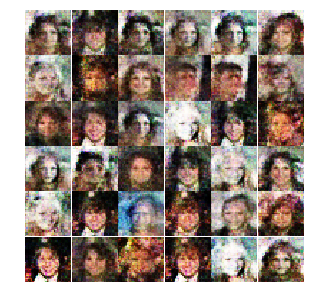

Epoch 2050/30000... Discriminator Loss: 0.3434... Generator Loss: 4.9564
Epoch 2100/30000... Discriminator Loss: 0.3364... Generator Loss: 4.7519
Epoch 2150/30000... Discriminator Loss: 0.3358... Generator Loss: 5.3434
Epoch 2200/30000... Discriminator Loss: 0.3392... Generator Loss: 4.8608
Epoch 2250/30000... Discriminator Loss: 0.3388... Generator Loss: 4.8099
Epoch 2300/30000... Discriminator Loss: 0.3343... Generator Loss: 4.9707
Epoch 2350/30000... Discriminator Loss: 0.3333... Generator Loss: 5.0919
Epoch 2400/30000... Discriminator Loss: 0.3350... Generator Loss: 5.2797
Epoch 2450/30000... Discriminator Loss: 0.5442... Generator Loss: 3.0628
Epoch 2500/30000... Discriminator Loss: 0.3606... Generator Loss: 3.6890


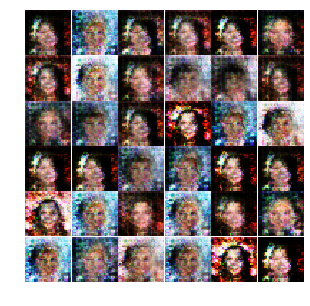

Epoch 2550/30000... Discriminator Loss: 0.3525... Generator Loss: 4.2419
Epoch 2600/30000... Discriminator Loss: 0.3668... Generator Loss: 5.5959
Epoch 2650/30000... Discriminator Loss: 0.3476... Generator Loss: 4.3557
Epoch 2700/30000... Discriminator Loss: 0.3366... Generator Loss: 5.5381
Epoch 2750/30000... Discriminator Loss: 0.3402... Generator Loss: 4.5086
Epoch 2800/30000... Discriminator Loss: 0.3423... Generator Loss: 4.3615
Epoch 2850/30000... Discriminator Loss: 0.3349... Generator Loss: 5.0754
Epoch 2900/30000... Discriminator Loss: 0.3336... Generator Loss: 5.0850
Epoch 2950/30000... Discriminator Loss: 0.3335... Generator Loss: 5.2705
Epoch 3000/30000... Discriminator Loss: 0.3320... Generator Loss: 5.5187


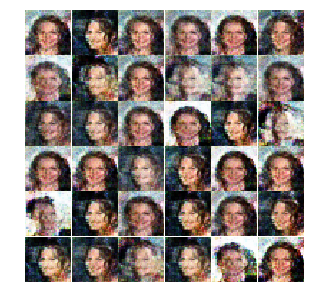

Epoch 3050/30000... Discriminator Loss: 0.3405... Generator Loss: 5.5926
Epoch 3100/30000... Discriminator Loss: 0.3410... Generator Loss: 5.0529
Epoch 3150/30000... Discriminator Loss: 0.5750... Generator Loss: 3.3686
Epoch 3200/30000... Discriminator Loss: 0.4170... Generator Loss: 2.8840
Epoch 3250/30000... Discriminator Loss: 0.3733... Generator Loss: 3.5864
Epoch 3300/30000... Discriminator Loss: 0.3727... Generator Loss: 3.3861
Epoch 3350/30000... Discriminator Loss: 0.3666... Generator Loss: 4.4330
Epoch 3400/30000... Discriminator Loss: 0.3505... Generator Loss: 4.3868
Epoch 3450/30000... Discriminator Loss: 0.3519... Generator Loss: 4.7672
Epoch 3500/30000... Discriminator Loss: 0.3442... Generator Loss: 4.2157


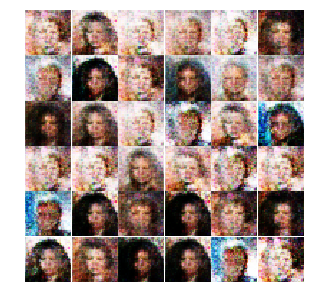

Epoch 3550/30000... Discriminator Loss: 0.3428... Generator Loss: 4.8339
Epoch 3600/30000... Discriminator Loss: 0.3876... Generator Loss: 3.7845
Epoch 3650/30000... Discriminator Loss: 0.3492... Generator Loss: 4.8281
Epoch 3700/30000... Discriminator Loss: 0.3360... Generator Loss: 4.7505
Epoch 3750/30000... Discriminator Loss: 0.3393... Generator Loss: 5.0536
Epoch 3800/30000... Discriminator Loss: 0.3349... Generator Loss: 4.9825
Epoch 3850/30000... Discriminator Loss: 0.3513... Generator Loss: 5.7874
Epoch 3900/30000... Discriminator Loss: 0.4469... Generator Loss: 4.0380
Epoch 3950/30000... Discriminator Loss: 0.3495... Generator Loss: 4.0498
Epoch 4000/30000... Discriminator Loss: 0.3384... Generator Loss: 4.6098


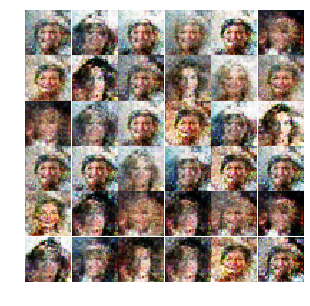

Epoch 4050/30000... Discriminator Loss: 0.3373... Generator Loss: 4.6945
Epoch 4100/30000... Discriminator Loss: 0.3409... Generator Loss: 4.6435
Epoch 4150/30000... Discriminator Loss: 0.3385... Generator Loss: 4.8120
Epoch 4200/30000... Discriminator Loss: 0.3384... Generator Loss: 4.7222
Epoch 4250/30000... Discriminator Loss: 0.3367... Generator Loss: 4.8021
Epoch 4300/30000... Discriminator Loss: 0.3425... Generator Loss: 4.9555
Epoch 4350/30000... Discriminator Loss: 0.3353... Generator Loss: 5.2021
Epoch 4400/30000... Discriminator Loss: 0.3538... Generator Loss: 4.6632
Epoch 4450/30000... Discriminator Loss: 0.3602... Generator Loss: 4.3935
Epoch 4500/30000... Discriminator Loss: 0.3307... Generator Loss: 5.7880


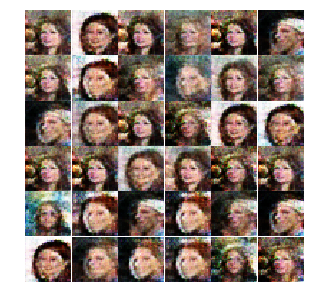

Epoch 4550/30000... Discriminator Loss: 0.4017... Generator Loss: 3.9958
Epoch 4600/30000... Discriminator Loss: 0.3378... Generator Loss: 5.9040
Epoch 4650/30000... Discriminator Loss: 0.3426... Generator Loss: 5.8895
Epoch 4700/30000... Discriminator Loss: 0.3402... Generator Loss: 5.2875
Epoch 4750/30000... Discriminator Loss: 0.3358... Generator Loss: 5.3566
Epoch 4800/30000... Discriminator Loss: 0.3398... Generator Loss: 6.4420
Epoch 4850/30000... Discriminator Loss: 0.3302... Generator Loss: 5.7225
Epoch 4900/30000... Discriminator Loss: 0.3509... Generator Loss: 4.8826
Epoch 4950/30000... Discriminator Loss: 0.3456... Generator Loss: 6.5613
Epoch 5000/30000... Discriminator Loss: 0.3375... Generator Loss: 6.5255


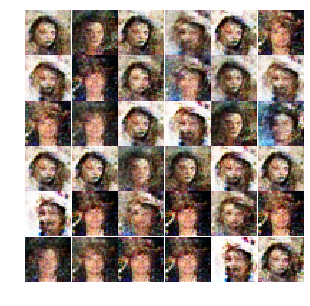

Epoch 5050/30000... Discriminator Loss: 0.4571... Generator Loss: 3.6178
Epoch 5100/30000... Discriminator Loss: 0.3550... Generator Loss: 4.1350
Epoch 5150/30000... Discriminator Loss: 0.3489... Generator Loss: 4.0936
Epoch 5200/30000... Discriminator Loss: 0.3453... Generator Loss: 4.2484
Epoch 5250/30000... Discriminator Loss: 0.3637... Generator Loss: 4.1847
Epoch 5300/30000... Discriminator Loss: 0.3375... Generator Loss: 5.0812
Epoch 5350/30000... Discriminator Loss: 0.3342... Generator Loss: 5.2446
Epoch 5400/30000... Discriminator Loss: 0.3341... Generator Loss: 5.7093
Epoch 5450/30000... Discriminator Loss: 0.3423... Generator Loss: 6.0163
Epoch 5500/30000... Discriminator Loss: 0.3412... Generator Loss: 5.1067


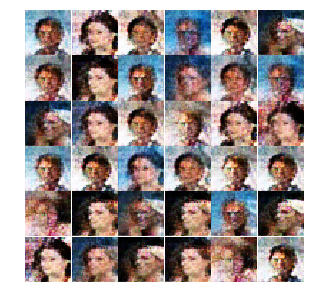

Epoch 5550/30000... Discriminator Loss: 0.3981... Generator Loss: 4.1769
Epoch 5600/30000... Discriminator Loss: 1.1662... Generator Loss: 10.4854
Epoch 5650/30000... Discriminator Loss: 0.3397... Generator Loss: 4.5884
Epoch 5700/30000... Discriminator Loss: 0.3357... Generator Loss: 4.9277
Epoch 5750/30000... Discriminator Loss: 0.3426... Generator Loss: 5.7956
Epoch 5800/30000... Discriminator Loss: 0.3359... Generator Loss: 5.6237
Epoch 5850/30000... Discriminator Loss: 0.3354... Generator Loss: 5.9093
Epoch 5900/30000... Discriminator Loss: 0.3324... Generator Loss: 5.5170
Epoch 5950/30000... Discriminator Loss: 0.3403... Generator Loss: 4.7320
Epoch 6000/30000... Discriminator Loss: 0.3336... Generator Loss: 5.1397


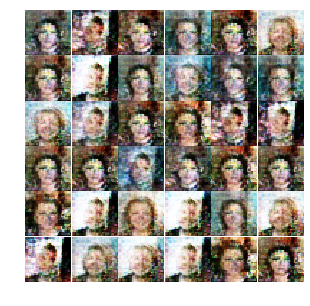

Epoch 6050/30000... Discriminator Loss: 0.3328... Generator Loss: 5.6532
Epoch 6100/30000... Discriminator Loss: 0.3329... Generator Loss: 6.0610
Epoch 6150/30000... Discriminator Loss: 0.3392... Generator Loss: 7.0055
Epoch 6200/30000... Discriminator Loss: 0.3304... Generator Loss: 5.7671
Epoch 6250/30000... Discriminator Loss: 0.3382... Generator Loss: 5.2064
Epoch 6300/30000... Discriminator Loss: 0.3351... Generator Loss: 6.0987
Epoch 6350/30000... Discriminator Loss: 0.3354... Generator Loss: 5.4279
Epoch 6400/30000... Discriminator Loss: 0.3385... Generator Loss: 5.2233
Epoch 6450/30000... Discriminator Loss: 0.3296... Generator Loss: 6.0284
Epoch 6500/30000... Discriminator Loss: 0.3420... Generator Loss: 6.4456


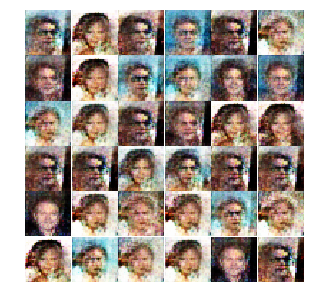

Epoch 6550/30000... Discriminator Loss: 0.3376... Generator Loss: 6.3740
Epoch 6600/30000... Discriminator Loss: 0.3328... Generator Loss: 5.9089
Epoch 6650/30000... Discriminator Loss: 0.3395... Generator Loss: 5.6546
Epoch 6700/30000... Discriminator Loss: 0.3311... Generator Loss: 6.5195
Epoch 6750/30000... Discriminator Loss: 0.5678... Generator Loss: 2.9337
Epoch 6800/30000... Discriminator Loss: 0.3545... Generator Loss: 3.9962
Epoch 6850/30000... Discriminator Loss: 0.3433... Generator Loss: 4.6843
Epoch 6900/30000... Discriminator Loss: 0.3403... Generator Loss: 4.4472
Epoch 6950/30000... Discriminator Loss: 0.3574... Generator Loss: 4.2331
Epoch 7000/30000... Discriminator Loss: 0.3394... Generator Loss: 5.7236


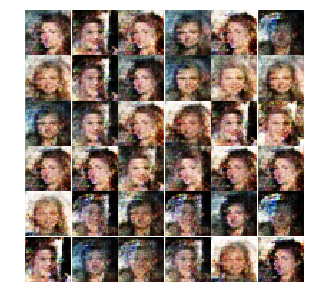

Epoch 7050/30000... Discriminator Loss: 0.3326... Generator Loss: 5.3183
Epoch 7100/30000... Discriminator Loss: 0.3323... Generator Loss: 5.6662
Epoch 7150/30000... Discriminator Loss: 0.3533... Generator Loss: 5.7655
Epoch 7200/30000... Discriminator Loss: 0.3362... Generator Loss: 4.8533
Epoch 7250/30000... Discriminator Loss: 0.3372... Generator Loss: 5.9193
Epoch 7300/30000... Discriminator Loss: 0.3353... Generator Loss: 5.8202
Epoch 7350/30000... Discriminator Loss: 0.3378... Generator Loss: 5.9628
Epoch 7400/30000... Discriminator Loss: 0.3337... Generator Loss: 5.7615
Epoch 7450/30000... Discriminator Loss: 0.3310... Generator Loss: 6.0020
Epoch 7500/30000... Discriminator Loss: 0.3312... Generator Loss: 5.5390


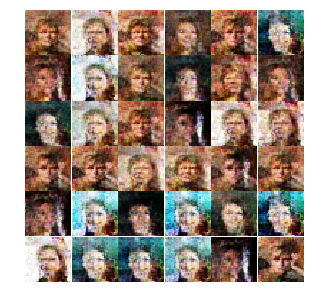

Epoch 7550/30000... Discriminator Loss: 0.3458... Generator Loss: 5.2040
Epoch 7600/30000... Discriminator Loss: 0.4767... Generator Loss: 2.7231
Epoch 7650/30000... Discriminator Loss: 0.3606... Generator Loss: 3.8236
Epoch 7700/30000... Discriminator Loss: 0.3494... Generator Loss: 3.9830
Epoch 7750/30000... Discriminator Loss: 0.3464... Generator Loss: 4.2583
Epoch 7800/30000... Discriminator Loss: 0.3432... Generator Loss: 5.1861
Epoch 7850/30000... Discriminator Loss: 0.3421... Generator Loss: 5.0543
Epoch 7900/30000... Discriminator Loss: 0.3427... Generator Loss: 5.4073
Epoch 7950/30000... Discriminator Loss: 0.3366... Generator Loss: 5.0797
Epoch 8000/30000... Discriminator Loss: 0.3411... Generator Loss: 4.7960


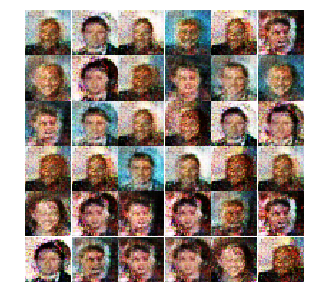

Epoch 8050/30000... Discriminator Loss: 0.3616... Generator Loss: 4.1505
Epoch 8100/30000... Discriminator Loss: 0.3346... Generator Loss: 5.1953
Epoch 8150/30000... Discriminator Loss: 0.3409... Generator Loss: 4.9998
Epoch 8200/30000... Discriminator Loss: 0.3383... Generator Loss: 5.2809
Epoch 8250/30000... Discriminator Loss: 0.3377... Generator Loss: 4.8793
Epoch 8300/30000... Discriminator Loss: 0.3442... Generator Loss: 4.3168
Epoch 8350/30000... Discriminator Loss: 0.3377... Generator Loss: 4.8062
Epoch 8400/30000... Discriminator Loss: 0.3324... Generator Loss: 5.3519
Epoch 8450/30000... Discriminator Loss: 0.3317... Generator Loss: 5.5432
Epoch 8500/30000... Discriminator Loss: 0.3360... Generator Loss: 5.1933


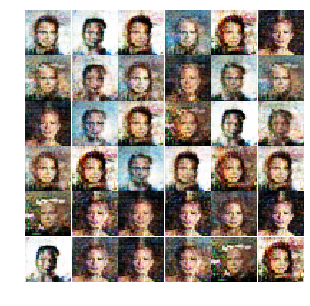

Epoch 8550/30000... Discriminator Loss: 0.3353... Generator Loss: 5.4105
Epoch 8600/30000... Discriminator Loss: 0.3331... Generator Loss: 5.8988
Epoch 8650/30000... Discriminator Loss: 0.3327... Generator Loss: 5.4407
Epoch 8700/30000... Discriminator Loss: 0.3354... Generator Loss: 5.7941
Epoch 8750/30000... Discriminator Loss: 0.3596... Generator Loss: 6.1050
Epoch 8800/30000... Discriminator Loss: 0.3306... Generator Loss: 6.0896
Epoch 8850/30000... Discriminator Loss: 0.3296... Generator Loss: 6.0298
Epoch 8900/30000... Discriminator Loss: 0.3325... Generator Loss: 5.9069
Epoch 8950/30000... Discriminator Loss: 0.3316... Generator Loss: 5.7145
Epoch 9000/30000... Discriminator Loss: 0.3328... Generator Loss: 6.3391


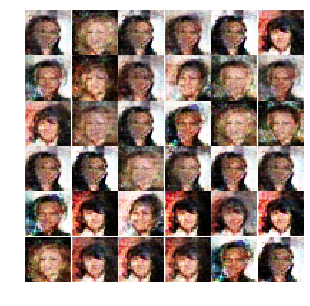

Epoch 9050/30000... Discriminator Loss: 0.3311... Generator Loss: 5.7298
Epoch 9100/30000... Discriminator Loss: 0.3376... Generator Loss: 5.5960
Epoch 9150/30000... Discriminator Loss: 0.3412... Generator Loss: 4.6234
Epoch 9200/30000... Discriminator Loss: 0.3315... Generator Loss: 5.4848
Epoch 9250/30000... Discriminator Loss: 0.3361... Generator Loss: 5.2323
Epoch 9300/30000... Discriminator Loss: 0.3322... Generator Loss: 5.6276
Epoch 9350/30000... Discriminator Loss: 0.3317... Generator Loss: 5.7584
Epoch 9400/30000... Discriminator Loss: 0.3493... Generator Loss: 6.0370
Epoch 9450/30000... Discriminator Loss: 0.3356... Generator Loss: 5.2213
Epoch 9500/30000... Discriminator Loss: 0.3383... Generator Loss: 6.1518


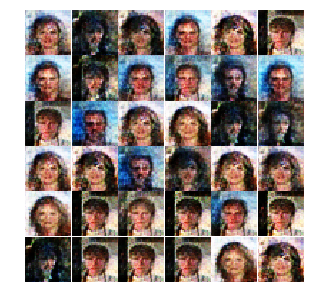

Epoch 9550/30000... Discriminator Loss: 0.3325... Generator Loss: 5.4138
Epoch 9600/30000... Discriminator Loss: 0.3310... Generator Loss: 6.1520
Epoch 9650/30000... Discriminator Loss: 0.3283... Generator Loss: 6.4159
Epoch 9700/30000... Discriminator Loss: 0.3317... Generator Loss: 5.7293
Epoch 9750/30000... Discriminator Loss: 0.3332... Generator Loss: 6.2466
Epoch 9800/30000... Discriminator Loss: 0.3356... Generator Loss: 6.5267
Epoch 9850/30000... Discriminator Loss: 0.3312... Generator Loss: 5.9254
Epoch 9900/30000... Discriminator Loss: 0.3302... Generator Loss: 6.2165
Epoch 9950/30000... Discriminator Loss: 0.3296... Generator Loss: 6.6111
Epoch 10000/30000... Discriminator Loss: 0.3676... Generator Loss: 6.7587


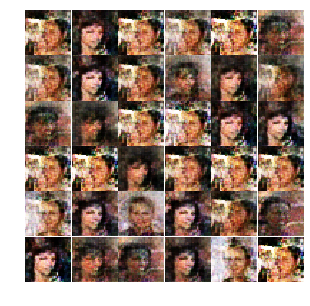

Epoch 10050/30000... Discriminator Loss: 0.3307... Generator Loss: 6.3759
Epoch 10100/30000... Discriminator Loss: 0.3486... Generator Loss: 5.2761
Epoch 10150/30000... Discriminator Loss: 0.3316... Generator Loss: 6.5375
Epoch 10200/30000... Discriminator Loss: 0.3299... Generator Loss: 6.3420
Epoch 10250/30000... Discriminator Loss: 0.3444... Generator Loss: 6.0017
Epoch 10300/30000... Discriminator Loss: 0.3282... Generator Loss: 6.6097
Epoch 10350/30000... Discriminator Loss: 0.3394... Generator Loss: 6.9610
Epoch 10400/30000... Discriminator Loss: 0.3406... Generator Loss: 5.8961
Epoch 10450/30000... Discriminator Loss: 0.3274... Generator Loss: 6.8661
Epoch 10500/30000... Discriminator Loss: 0.3474... Generator Loss: 7.1732


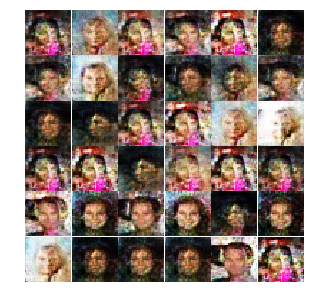

Epoch 10550/30000... Discriminator Loss: 0.3797... Generator Loss: 4.1000
Epoch 10600/30000... Discriminator Loss: 0.3478... Generator Loss: 4.2137
Epoch 10650/30000... Discriminator Loss: 0.3399... Generator Loss: 5.0475
Epoch 10700/30000... Discriminator Loss: 0.3336... Generator Loss: 5.1596
Epoch 10750/30000... Discriminator Loss: 0.3597... Generator Loss: 4.3248
Epoch 10800/30000... Discriminator Loss: 0.3330... Generator Loss: 5.3834
Epoch 10850/30000... Discriminator Loss: 0.3319... Generator Loss: 5.3780
Epoch 10900/30000... Discriminator Loss: 0.3404... Generator Loss: 4.6393
Epoch 10950/30000... Discriminator Loss: 0.3310... Generator Loss: 5.4101
Epoch 11000/30000... Discriminator Loss: 0.3368... Generator Loss: 5.0988


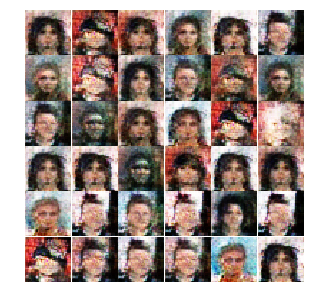

Epoch 11050/30000... Discriminator Loss: 0.3570... Generator Loss: 4.8260
Epoch 11100/30000... Discriminator Loss: 0.3328... Generator Loss: 5.3095
Epoch 11150/30000... Discriminator Loss: 0.3362... Generator Loss: 4.8692
Epoch 11200/30000... Discriminator Loss: 0.3307... Generator Loss: 5.8852
Epoch 11250/30000... Discriminator Loss: 0.3322... Generator Loss: 6.3662
Epoch 11300/30000... Discriminator Loss: 0.3369... Generator Loss: 5.5776
Epoch 11350/30000... Discriminator Loss: 0.3332... Generator Loss: 5.6653
Epoch 11400/30000... Discriminator Loss: 0.3859... Generator Loss: 4.8649
Epoch 11450/30000... Discriminator Loss: 0.3308... Generator Loss: 6.0853
Epoch 11500/30000... Discriminator Loss: 0.3362... Generator Loss: 6.4359


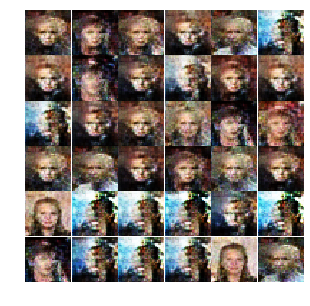

Epoch 11550/30000... Discriminator Loss: 0.3379... Generator Loss: 6.5594
Epoch 11600/30000... Discriminator Loss: 0.3441... Generator Loss: 5.2702
Epoch 11650/30000... Discriminator Loss: 0.3326... Generator Loss: 6.6591
Epoch 11700/30000... Discriminator Loss: 0.3294... Generator Loss: 6.6847
Epoch 11750/30000... Discriminator Loss: 0.3471... Generator Loss: 6.9647
Epoch 11800/30000... Discriminator Loss: 0.3368... Generator Loss: 6.4044
Epoch 11850/30000... Discriminator Loss: 0.3329... Generator Loss: 5.7566
Epoch 11900/30000... Discriminator Loss: 0.3331... Generator Loss: 5.7278
Epoch 11950/30000... Discriminator Loss: 0.3418... Generator Loss: 5.6108
Epoch 12000/30000... Discriminator Loss: 0.3370... Generator Loss: 5.5618


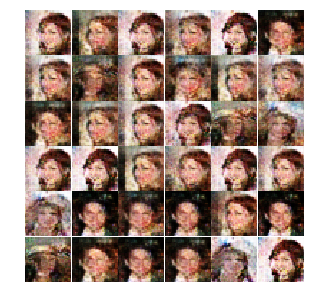

Epoch 12050/30000... Discriminator Loss: 0.3287... Generator Loss: 6.2345
Epoch 12100/30000... Discriminator Loss: 0.3339... Generator Loss: 6.3688
Epoch 12150/30000... Discriminator Loss: 6.1756... Generator Loss: 22.3574
Epoch 12200/30000... Discriminator Loss: 0.3462... Generator Loss: 4.4120
Epoch 12250/30000... Discriminator Loss: 0.3380... Generator Loss: 4.7758
Epoch 12300/30000... Discriminator Loss: 0.3338... Generator Loss: 5.0531
Epoch 12350/30000... Discriminator Loss: 0.3367... Generator Loss: 5.7842
Epoch 12400/30000... Discriminator Loss: 0.3347... Generator Loss: 5.7726
Epoch 12450/30000... Discriminator Loss: 0.3349... Generator Loss: 5.9585
Epoch 12500/30000... Discriminator Loss: 0.3298... Generator Loss: 5.6393


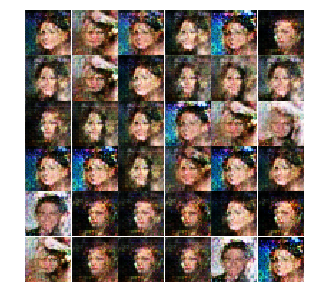

Epoch 12550/30000... Discriminator Loss: 0.3604... Generator Loss: 4.7271
Epoch 12600/30000... Discriminator Loss: 0.3298... Generator Loss: 6.3536
Epoch 12650/30000... Discriminator Loss: 0.3285... Generator Loss: 6.3576
Epoch 12700/30000... Discriminator Loss: 0.3289... Generator Loss: 6.2312
Epoch 12750/30000... Discriminator Loss: 0.3301... Generator Loss: 6.6253
Epoch 12800/30000... Discriminator Loss: 0.3286... Generator Loss: 6.1655
Epoch 12850/30000... Discriminator Loss: 0.3392... Generator Loss: 6.3582
Epoch 12900/30000... Discriminator Loss: 0.3292... Generator Loss: 6.1162
Epoch 12950/30000... Discriminator Loss: 0.3304... Generator Loss: 7.0361
Epoch 13000/30000... Discriminator Loss: 0.3308... Generator Loss: 6.0782


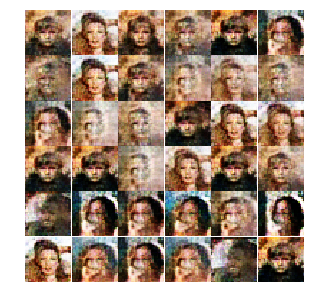

Epoch 13050/30000... Discriminator Loss: 0.3394... Generator Loss: 6.9827
Epoch 13100/30000... Discriminator Loss: 0.3334... Generator Loss: 5.8546
Epoch 13150/30000... Discriminator Loss: 1.8888... Generator Loss: 4.9030
Epoch 13200/30000... Discriminator Loss: 0.3380... Generator Loss: 4.6636
Epoch 13250/30000... Discriminator Loss: 0.3330... Generator Loss: 5.2858
Epoch 13300/30000... Discriminator Loss: 0.3312... Generator Loss: 5.6334
Epoch 13350/30000... Discriminator Loss: 0.3310... Generator Loss: 5.7154
Epoch 13400/30000... Discriminator Loss: 0.3312... Generator Loss: 5.6165
Epoch 13450/30000... Discriminator Loss: 0.3303... Generator Loss: 5.6299
Epoch 13500/30000... Discriminator Loss: 0.3321... Generator Loss: 6.5550


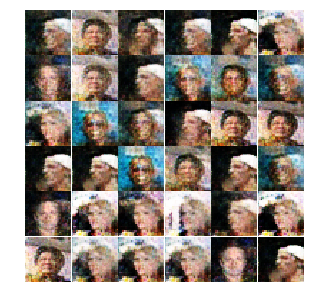

Epoch 13550/30000... Discriminator Loss: 0.3298... Generator Loss: 6.0473
Epoch 13600/30000... Discriminator Loss: 0.3300... Generator Loss: 6.0990
Epoch 13650/30000... Discriminator Loss: 0.3274... Generator Loss: 6.8534
Epoch 13700/30000... Discriminator Loss: 0.3299... Generator Loss: 6.3623
Epoch 13750/30000... Discriminator Loss: 0.3336... Generator Loss: 6.4636
Epoch 13800/30000... Discriminator Loss: 0.3315... Generator Loss: 5.9055
Epoch 13850/30000... Discriminator Loss: 0.3270... Generator Loss: 6.7306
Epoch 13900/30000... Discriminator Loss: 0.3339... Generator Loss: 6.1883
Epoch 13950/30000... Discriminator Loss: 0.3333... Generator Loss: 5.8561
Epoch 14000/30000... Discriminator Loss: 0.3393... Generator Loss: 6.0519


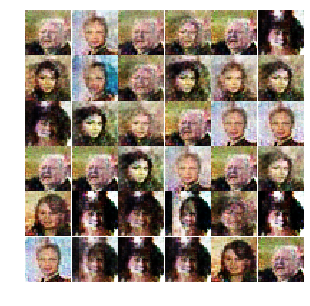

Epoch 14050/30000... Discriminator Loss: 0.3283... Generator Loss: 6.3693
Epoch 14100/30000... Discriminator Loss: 0.3279... Generator Loss: 6.5352
Epoch 14150/30000... Discriminator Loss: 0.3293... Generator Loss: 6.5469
Epoch 14200/30000... Discriminator Loss: 0.3315... Generator Loss: 5.8112
Epoch 14250/30000... Discriminator Loss: 0.3278... Generator Loss: 6.5851
Epoch 14300/30000... Discriminator Loss: 0.3393... Generator Loss: 6.1554
Epoch 14350/30000... Discriminator Loss: 0.3278... Generator Loss: 7.0548
Epoch 14400/30000... Discriminator Loss: 0.3843... Generator Loss: 3.5560
Epoch 14450/30000... Discriminator Loss: 0.3429... Generator Loss: 4.4138
Epoch 14500/30000... Discriminator Loss: 0.3366... Generator Loss: 4.8773


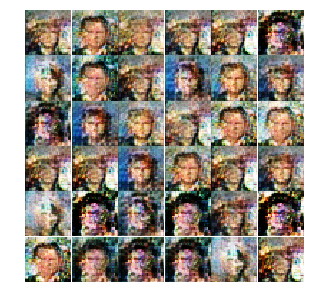

Epoch 14550/30000... Discriminator Loss: 0.3400... Generator Loss: 5.1746
Epoch 14600/30000... Discriminator Loss: 0.3384... Generator Loss: 5.0391
Epoch 14650/30000... Discriminator Loss: 0.3320... Generator Loss: 5.6326
Epoch 14700/30000... Discriminator Loss: 0.3299... Generator Loss: 6.4368
Epoch 14750/30000... Discriminator Loss: 0.3331... Generator Loss: 5.8495
Epoch 14800/30000... Discriminator Loss: 0.3351... Generator Loss: 5.9161
Epoch 14850/30000... Discriminator Loss: 0.3296... Generator Loss: 6.1718
Epoch 14900/30000... Discriminator Loss: 0.3323... Generator Loss: 6.9235
Epoch 14950/30000... Discriminator Loss: 0.3297... Generator Loss: 5.8204
Epoch 15000/30000... Discriminator Loss: 0.3718... Generator Loss: 7.2322


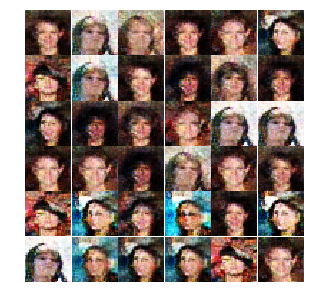

Epoch 15050/30000... Discriminator Loss: 0.3380... Generator Loss: 6.5037
Epoch 15100/30000... Discriminator Loss: 0.3300... Generator Loss: 6.1669
Epoch 15150/30000... Discriminator Loss: 0.3464... Generator Loss: 5.6210
Epoch 15200/30000... Discriminator Loss: 0.3713... Generator Loss: 4.8565
Epoch 15250/30000... Discriminator Loss: 0.3330... Generator Loss: 6.9115
Epoch 15300/30000... Discriminator Loss: 0.3292... Generator Loss: 6.1914
Epoch 15350/30000... Discriminator Loss: 0.3310... Generator Loss: 6.6385
Epoch 15400/30000... Discriminator Loss: 0.3288... Generator Loss: 6.8803
Epoch 15450/30000... Discriminator Loss: 0.3695... Generator Loss: 6.8637
Epoch 15500/30000... Discriminator Loss: 0.3287... Generator Loss: 6.2325


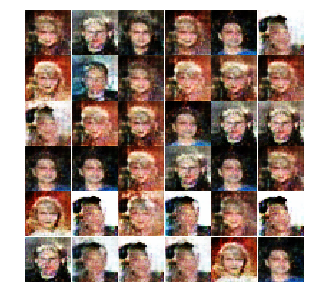

Epoch 15550/30000... Discriminator Loss: 0.3395... Generator Loss: 4.6675
Epoch 15600/30000... Discriminator Loss: 0.3458... Generator Loss: 4.9993
Epoch 15650/30000... Discriminator Loss: 0.3357... Generator Loss: 6.3704
Epoch 15700/30000... Discriminator Loss: 0.3327... Generator Loss: 6.1061
Epoch 15750/30000... Discriminator Loss: 0.3319... Generator Loss: 6.0037
Epoch 15800/30000... Discriminator Loss: 0.3330... Generator Loss: 6.5743
Epoch 15850/30000... Discriminator Loss: 0.3346... Generator Loss: 5.7069
Epoch 15900/30000... Discriminator Loss: 0.3281... Generator Loss: 6.8161
Epoch 15950/30000... Discriminator Loss: 0.3283... Generator Loss: 6.2900
Epoch 16000/30000... Discriminator Loss: 0.3370... Generator Loss: 5.6458


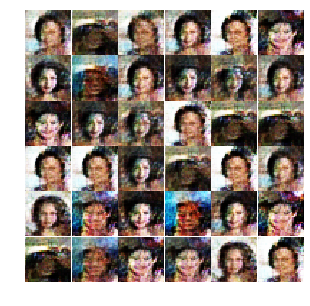

Epoch 16050/30000... Discriminator Loss: 0.3300... Generator Loss: 6.1892
Epoch 16100/30000... Discriminator Loss: 0.3452... Generator Loss: 5.5376
Epoch 16150/30000... Discriminator Loss: 0.3291... Generator Loss: 6.7950
Epoch 16200/30000... Discriminator Loss: 0.3309... Generator Loss: 6.8185
Epoch 16250/30000... Discriminator Loss: 0.3296... Generator Loss: 6.1749
Epoch 16300/30000... Discriminator Loss: 0.3438... Generator Loss: 7.1107
Epoch 16350/30000... Discriminator Loss: 0.3362... Generator Loss: 6.4350
Epoch 16400/30000... Discriminator Loss: 0.3340... Generator Loss: 6.0030
Epoch 16450/30000... Discriminator Loss: 0.3285... Generator Loss: 6.8244
Epoch 16500/30000... Discriminator Loss: 0.3282... Generator Loss: 6.7997


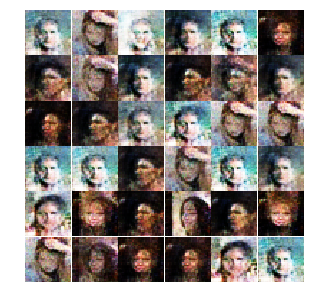

Epoch 16550/30000... Discriminator Loss: 0.3287... Generator Loss: 6.7117
Epoch 16600/30000... Discriminator Loss: 0.3492... Generator Loss: 5.5889
Epoch 16650/30000... Discriminator Loss: 0.3365... Generator Loss: 5.5230
Epoch 16700/30000... Discriminator Loss: 0.3294... Generator Loss: 7.3279
Epoch 16750/30000... Discriminator Loss: 0.3343... Generator Loss: 6.8415
Epoch 16800/30000... Discriminator Loss: 0.3272... Generator Loss: 7.0043
Epoch 16850/30000... Discriminator Loss: 0.3334... Generator Loss: 6.4008
Epoch 16900/30000... Discriminator Loss: 0.3367... Generator Loss: 5.9929
Epoch 16950/30000... Discriminator Loss: 0.3592... Generator Loss: 4.0000
Epoch 17000/30000... Discriminator Loss: 0.3397... Generator Loss: 4.7598


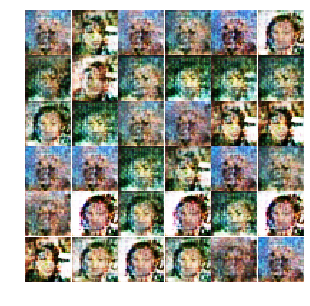

Epoch 17050/30000... Discriminator Loss: 0.3345... Generator Loss: 5.0740
Epoch 17100/30000... Discriminator Loss: 0.3346... Generator Loss: 5.1326
Epoch 17150/30000... Discriminator Loss: 0.3320... Generator Loss: 5.3864
Epoch 17200/30000... Discriminator Loss: 0.3336... Generator Loss: 6.1211
Epoch 17250/30000... Discriminator Loss: 0.3311... Generator Loss: 5.5641
Epoch 17300/30000... Discriminator Loss: 0.3289... Generator Loss: 6.0529
Epoch 17350/30000... Discriminator Loss: 0.3430... Generator Loss: 5.6573
Epoch 17400/30000... Discriminator Loss: 0.3309... Generator Loss: 5.9112
Epoch 17450/30000... Discriminator Loss: 0.3383... Generator Loss: 6.1821
Epoch 17500/30000... Discriminator Loss: 0.3358... Generator Loss: 5.8087


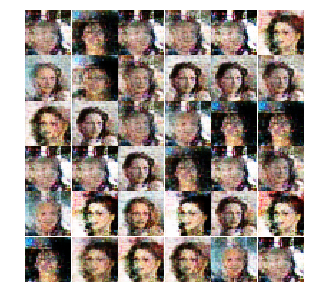

Epoch 17550/30000... Discriminator Loss: 0.3424... Generator Loss: 6.2619
Epoch 17600/30000... Discriminator Loss: 0.3285... Generator Loss: 6.3391
Epoch 17650/30000... Discriminator Loss: 0.3302... Generator Loss: 5.7033
Epoch 17700/30000... Discriminator Loss: 0.3280... Generator Loss: 6.4528
Epoch 17750/30000... Discriminator Loss: 0.3274... Generator Loss: 6.8453
Epoch 17800/30000... Discriminator Loss: 0.3324... Generator Loss: 6.6021
Epoch 17850/30000... Discriminator Loss: 0.3312... Generator Loss: 5.9737
Epoch 17900/30000... Discriminator Loss: 0.3319... Generator Loss: 6.5805
Epoch 17950/30000... Discriminator Loss: 0.3322... Generator Loss: 6.8438
Epoch 18000/30000... Discriminator Loss: 0.3436... Generator Loss: 5.8511


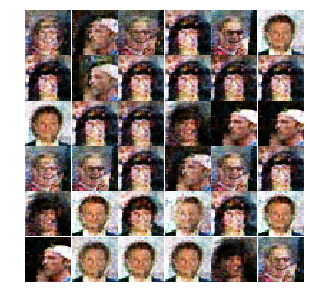

Epoch 18050/30000... Discriminator Loss: 0.3293... Generator Loss: 6.2853
Epoch 18100/30000... Discriminator Loss: 0.3292... Generator Loss: 6.6638
Epoch 18150/30000... Discriminator Loss: 0.3296... Generator Loss: 6.4264
Epoch 18200/30000... Discriminator Loss: 0.3289... Generator Loss: 6.0788
Epoch 18250/30000... Discriminator Loss: 0.3540... Generator Loss: 4.1035
Epoch 18300/30000... Discriminator Loss: 0.3380... Generator Loss: 4.8586
Epoch 18350/30000... Discriminator Loss: 0.3315... Generator Loss: 5.4176
Epoch 18400/30000... Discriminator Loss: 0.3338... Generator Loss: 5.4837
Epoch 18450/30000... Discriminator Loss: 0.3338... Generator Loss: 5.2796
Epoch 18500/30000... Discriminator Loss: 0.3335... Generator Loss: 5.5275


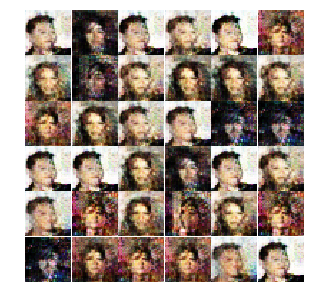

Epoch 18550/30000... Discriminator Loss: 0.3336... Generator Loss: 5.9253
Epoch 18600/30000... Discriminator Loss: 0.3303... Generator Loss: 6.0519
Epoch 18650/30000... Discriminator Loss: 0.3299... Generator Loss: 6.1640
Epoch 18700/30000... Discriminator Loss: 0.3301... Generator Loss: 5.9117
Epoch 18750/30000... Discriminator Loss: 0.3321... Generator Loss: 6.6539
Epoch 18800/30000... Discriminator Loss: 0.3332... Generator Loss: 5.6900
Epoch 18850/30000... Discriminator Loss: 0.3574... Generator Loss: 4.8238
Epoch 18900/30000... Discriminator Loss: 0.3293... Generator Loss: 6.5213
Epoch 18950/30000... Discriminator Loss: 0.3272... Generator Loss: 6.6945
Epoch 19000/30000... Discriminator Loss: 0.3362... Generator Loss: 6.7090


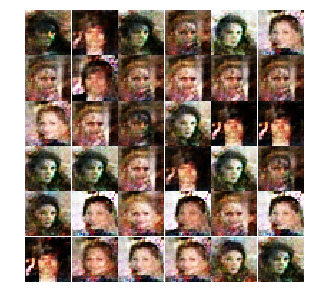

Epoch 19050/30000... Discriminator Loss: 0.3374... Generator Loss: 6.6910
Epoch 19100/30000... Discriminator Loss: 0.3284... Generator Loss: 6.3536
Epoch 19150/30000... Discriminator Loss: 0.3348... Generator Loss: 6.5811
Epoch 19200/30000... Discriminator Loss: 0.3285... Generator Loss: 6.6013
Epoch 19250/30000... Discriminator Loss: 0.3368... Generator Loss: 6.8745
Epoch 19300/30000... Discriminator Loss: 0.3285... Generator Loss: 6.6803
Epoch 19350/30000... Discriminator Loss: 0.3278... Generator Loss: 6.6507
Epoch 19400/30000... Discriminator Loss: 0.3388... Generator Loss: 7.2622
Epoch 19450/30000... Discriminator Loss: 0.3294... Generator Loss: 6.5842
Epoch 19500/30000... Discriminator Loss: 0.3296... Generator Loss: 6.5553


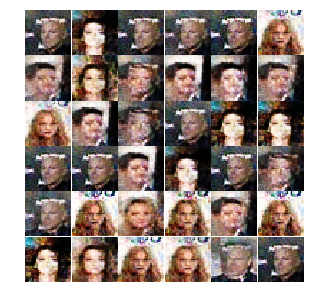

Epoch 19550/30000... Discriminator Loss: 0.3307... Generator Loss: 6.1183
Epoch 19600/30000... Discriminator Loss: 0.3295... Generator Loss: 7.4286
Epoch 19650/30000... Discriminator Loss: 0.3386... Generator Loss: 6.3384
Epoch 19700/30000... Discriminator Loss: 0.3294... Generator Loss: 7.3860
Epoch 19750/30000... Discriminator Loss: 0.3352... Generator Loss: 6.5340
Epoch 19800/30000... Discriminator Loss: 0.3318... Generator Loss: 7.1191
Epoch 19850/30000... Discriminator Loss: 0.3287... Generator Loss: 7.3535
Epoch 19900/30000... Discriminator Loss: 0.3328... Generator Loss: 7.7504
Epoch 19950/30000... Discriminator Loss: 0.3288... Generator Loss: 7.7404
Epoch 20000/30000... Discriminator Loss: 0.3295... Generator Loss: 6.4595


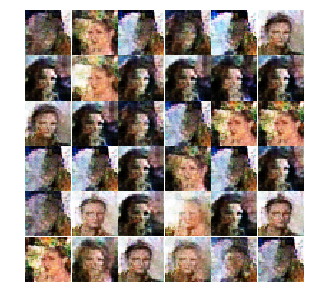

Epoch 20050/30000... Discriminator Loss: 0.3300... Generator Loss: 6.9764
Epoch 20100/30000... Discriminator Loss: 0.3517... Generator Loss: 4.3304
Epoch 20150/30000... Discriminator Loss: 0.3376... Generator Loss: 4.7270
Epoch 20200/30000... Discriminator Loss: 0.3323... Generator Loss: 5.3644
Epoch 20250/30000... Discriminator Loss: 0.3347... Generator Loss: 4.9813
Epoch 20300/30000... Discriminator Loss: 0.3322... Generator Loss: 5.5833
Epoch 20350/30000... Discriminator Loss: 0.3318... Generator Loss: 5.5823
Epoch 20400/30000... Discriminator Loss: 0.3283... Generator Loss: 6.2093
Epoch 20450/30000... Discriminator Loss: 0.3297... Generator Loss: 6.2310
Epoch 20500/30000... Discriminator Loss: 0.3293... Generator Loss: 6.4190


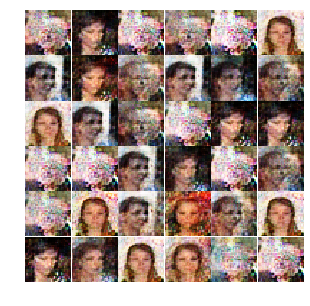

Epoch 20550/30000... Discriminator Loss: 0.3287... Generator Loss: 6.2398
Epoch 20600/30000... Discriminator Loss: 0.3300... Generator Loss: 6.5639
Epoch 20650/30000... Discriminator Loss: 0.3288... Generator Loss: 6.4008
Epoch 20700/30000... Discriminator Loss: 0.3302... Generator Loss: 6.5160
Epoch 20750/30000... Discriminator Loss: 0.3315... Generator Loss: 6.1245
Epoch 20800/30000... Discriminator Loss: 0.3281... Generator Loss: 6.3697
Epoch 20850/30000... Discriminator Loss: 0.3284... Generator Loss: 6.2482
Epoch 20900/30000... Discriminator Loss: 0.3388... Generator Loss: 6.0489
Epoch 20950/30000... Discriminator Loss: 0.3289... Generator Loss: 6.2270
Epoch 21000/30000... Discriminator Loss: 0.3318... Generator Loss: 6.1450


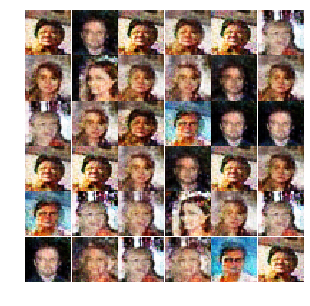

Epoch 21050/30000... Discriminator Loss: 0.3341... Generator Loss: 6.3390
Epoch 21100/30000... Discriminator Loss: 0.3284... Generator Loss: 6.9650
Epoch 21150/30000... Discriminator Loss: 0.3283... Generator Loss: 6.5774
Epoch 21200/30000... Discriminator Loss: 0.3303... Generator Loss: 7.2099
Epoch 21250/30000... Discriminator Loss: 0.3357... Generator Loss: 5.7858
Epoch 21300/30000... Discriminator Loss: 0.3288... Generator Loss: 7.0278
Epoch 21350/30000... Discriminator Loss: 0.3304... Generator Loss: 7.0824
Epoch 21400/30000... Discriminator Loss: 0.3295... Generator Loss: 6.9244
Epoch 21450/30000... Discriminator Loss: 0.3281... Generator Loss: 7.0533
Epoch 21500/30000... Discriminator Loss: 0.3288... Generator Loss: 7.3765


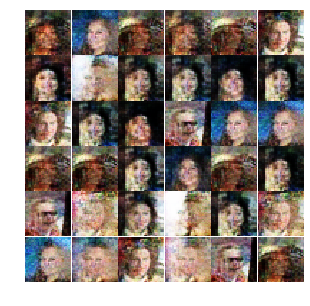

Epoch 21550/30000... Discriminator Loss: 0.3325... Generator Loss: 6.7831
Epoch 21600/30000... Discriminator Loss: 0.3280... Generator Loss: 7.3138
Epoch 21650/30000... Discriminator Loss: 0.3291... Generator Loss: 6.9270
Epoch 21700/30000... Discriminator Loss: 0.3294... Generator Loss: 6.9846
Epoch 21750/30000... Discriminator Loss: 0.4373... Generator Loss: 4.9841
Epoch 21800/30000... Discriminator Loss: 0.3325... Generator Loss: 5.3220
Epoch 21850/30000... Discriminator Loss: 0.3278... Generator Loss: 6.2388
Epoch 21900/30000... Discriminator Loss: 0.3299... Generator Loss: 6.0066
Epoch 21950/30000... Discriminator Loss: 0.3322... Generator Loss: 5.6573
Epoch 22000/30000... Discriminator Loss: 0.3289... Generator Loss: 6.2124


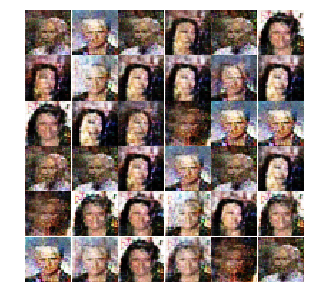

Epoch 22050/30000... Discriminator Loss: 0.3317... Generator Loss: 6.3497
Epoch 22100/30000... Discriminator Loss: 0.3282... Generator Loss: 6.4913
Epoch 22150/30000... Discriminator Loss: 0.3294... Generator Loss: 6.5842
Epoch 22200/30000... Discriminator Loss: 0.3309... Generator Loss: 7.7155
Epoch 22250/30000... Discriminator Loss: 0.3284... Generator Loss: 7.1545
Epoch 22300/30000... Discriminator Loss: 0.3285... Generator Loss: 6.9107
Epoch 22350/30000... Discriminator Loss: 0.3279... Generator Loss: 6.6624
Epoch 22400/30000... Discriminator Loss: 0.3315... Generator Loss: 6.1081
Epoch 22450/30000... Discriminator Loss: 0.3267... Generator Loss: 7.1822
Epoch 22500/30000... Discriminator Loss: 0.3271... Generator Loss: 7.1079


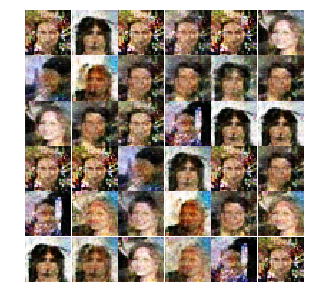

Epoch 22550/30000... Discriminator Loss: 0.3273... Generator Loss: 7.4932
Epoch 22600/30000... Discriminator Loss: 0.3274... Generator Loss: 6.7694
Epoch 22650/30000... Discriminator Loss: 0.3315... Generator Loss: 7.2769
Epoch 22700/30000... Discriminator Loss: 0.3268... Generator Loss: 7.5815
Epoch 22750/30000... Discriminator Loss: 0.3308... Generator Loss: 6.8869
Epoch 22800/30000... Discriminator Loss: 0.3282... Generator Loss: 7.0336
Epoch 22850/30000... Discriminator Loss: 0.3282... Generator Loss: 7.8150
Epoch 22900/30000... Discriminator Loss: 0.3316... Generator Loss: 6.3771
Epoch 22950/30000... Discriminator Loss: 0.3299... Generator Loss: 7.3609
Epoch 23000/30000... Discriminator Loss: 0.3295... Generator Loss: 6.5033


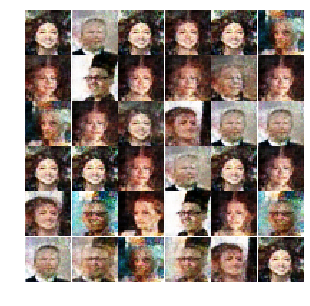

Epoch 23050/30000... Discriminator Loss: 0.3310... Generator Loss: 6.9643
Epoch 23100/30000... Discriminator Loss: 0.3287... Generator Loss: 7.2982
Epoch 23150/30000... Discriminator Loss: 0.3293... Generator Loss: 7.0598
Epoch 23200/30000... Discriminator Loss: 0.3290... Generator Loss: 7.1764
Epoch 23250/30000... Discriminator Loss: 0.3335... Generator Loss: 6.8044
Epoch 23300/30000... Discriminator Loss: 0.3328... Generator Loss: 6.3094
Epoch 23350/30000... Discriminator Loss: 0.3302... Generator Loss: 6.9255
Epoch 23400/30000... Discriminator Loss: 0.3299... Generator Loss: 7.7563
Epoch 23450/30000... Discriminator Loss: 1.2266... Generator Loss: 11.5121
Epoch 23500/30000... Discriminator Loss: 0.3340... Generator Loss: 5.1478


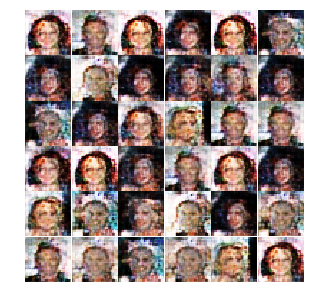

Epoch 23550/30000... Discriminator Loss: 0.3310... Generator Loss: 5.7727
Epoch 23600/30000... Discriminator Loss: 0.3322... Generator Loss: 5.7285
Epoch 23650/30000... Discriminator Loss: 0.3399... Generator Loss: 6.1688
Epoch 23700/30000... Discriminator Loss: 0.3314... Generator Loss: 6.7380
Epoch 23750/30000... Discriminator Loss: 0.3305... Generator Loss: 5.9512
Epoch 23800/30000... Discriminator Loss: 0.3530... Generator Loss: 6.8879
Epoch 23850/30000... Discriminator Loss: 0.3480... Generator Loss: 6.6472
Epoch 23900/30000... Discriminator Loss: 0.3298... Generator Loss: 6.2680
Epoch 23950/30000... Discriminator Loss: 0.3276... Generator Loss: 6.5159
Epoch 24000/30000... Discriminator Loss: 0.3266... Generator Loss: 7.4180


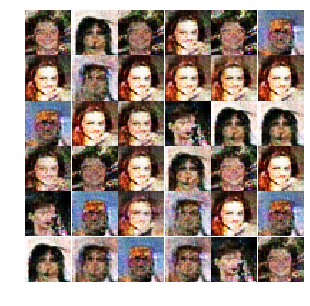

Epoch 24050/30000... Discriminator Loss: 0.3284... Generator Loss: 6.9663
Epoch 24100/30000... Discriminator Loss: 0.3273... Generator Loss: 6.4459
Epoch 24150/30000... Discriminator Loss: 0.3275... Generator Loss: 7.2229
Epoch 24200/30000... Discriminator Loss: 0.3274... Generator Loss: 7.1756
Epoch 24250/30000... Discriminator Loss: 0.3309... Generator Loss: 7.0857
Epoch 24300/30000... Discriminator Loss: 0.3281... Generator Loss: 7.0910
Epoch 24350/30000... Discriminator Loss: 0.3323... Generator Loss: 7.1963
Epoch 24400/30000... Discriminator Loss: 0.3290... Generator Loss: 7.3063
Epoch 24450/30000... Discriminator Loss: 0.3272... Generator Loss: 8.1564
Epoch 24500/30000... Discriminator Loss: 0.3289... Generator Loss: 7.4767


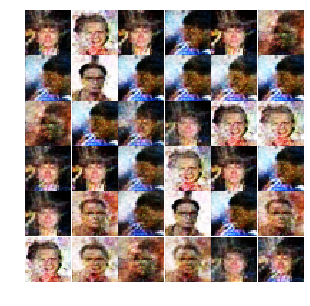

Epoch 24550/30000... Discriminator Loss: 0.3275... Generator Loss: 7.3007
Epoch 24600/30000... Discriminator Loss: 0.3286... Generator Loss: 7.3929
Epoch 24650/30000... Discriminator Loss: 0.3289... Generator Loss: 7.5120
Epoch 24700/30000... Discriminator Loss: 0.3285... Generator Loss: 7.8193
Epoch 24750/30000... Discriminator Loss: 0.3306... Generator Loss: 6.5780
Epoch 24800/30000... Discriminator Loss: 0.3307... Generator Loss: 7.1768
Epoch 24850/30000... Discriminator Loss: 0.3321... Generator Loss: 7.0351
Epoch 24900/30000... Discriminator Loss: 0.3303... Generator Loss: 7.2579
Epoch 24950/30000... Discriminator Loss: 0.3274... Generator Loss: 7.4098
Epoch 25000/30000... Discriminator Loss: 0.3445... Generator Loss: 4.4678


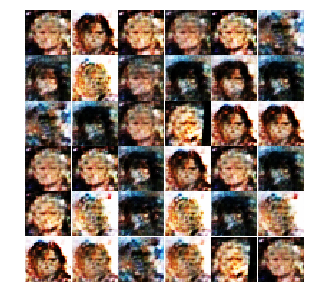

Epoch 25050/30000... Discriminator Loss: 0.3344... Generator Loss: 5.0602
Epoch 25100/30000... Discriminator Loss: 0.3308... Generator Loss: 5.5872
Epoch 25150/30000... Discriminator Loss: 0.3318... Generator Loss: 6.5172
Epoch 25200/30000... Discriminator Loss: 0.3346... Generator Loss: 5.7372
Epoch 25250/30000... Discriminator Loss: 0.3294... Generator Loss: 5.8409
Epoch 25300/30000... Discriminator Loss: 0.3284... Generator Loss: 6.3068
Epoch 25350/30000... Discriminator Loss: 0.3285... Generator Loss: 6.6996
Epoch 25400/30000... Discriminator Loss: 0.3280... Generator Loss: 6.6382
Epoch 25450/30000... Discriminator Loss: 0.3317... Generator Loss: 6.7616
Epoch 25500/30000... Discriminator Loss: 0.3283... Generator Loss: 6.4413


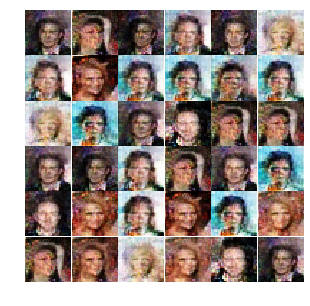

Epoch 25550/30000... Discriminator Loss: 0.3285... Generator Loss: 6.6649
Epoch 25600/30000... Discriminator Loss: 0.3277... Generator Loss: 6.6338
Epoch 25650/30000... Discriminator Loss: 0.3317... Generator Loss: 7.4171
Epoch 25700/30000... Discriminator Loss: 0.3289... Generator Loss: 6.4004
Epoch 25750/30000... Discriminator Loss: 0.3341... Generator Loss: 6.3102
Epoch 25800/30000... Discriminator Loss: 0.3329... Generator Loss: 6.2927
Epoch 25850/30000... Discriminator Loss: 0.3366... Generator Loss: 5.7915
Epoch 25900/30000... Discriminator Loss: 0.3338... Generator Loss: 6.8310
Epoch 25950/30000... Discriminator Loss: 0.3455... Generator Loss: 6.2492
Epoch 26000/30000... Discriminator Loss: 0.3270... Generator Loss: 7.2129


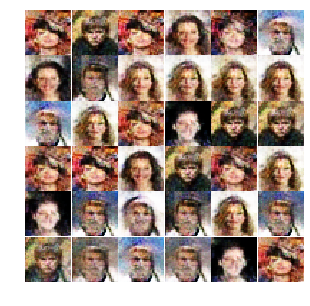

Epoch 26050/30000... Discriminator Loss: 0.3350... Generator Loss: 6.1553
Epoch 26100/30000... Discriminator Loss: 0.3271... Generator Loss: 7.1460
Epoch 26150/30000... Discriminator Loss: 0.3314... Generator Loss: 7.1239
Epoch 26200/30000... Discriminator Loss: 0.3285... Generator Loss: 6.7930
Epoch 26250/30000... Discriminator Loss: 0.3287... Generator Loss: 6.9485
Epoch 26300/30000... Discriminator Loss: 0.3274... Generator Loss: 7.4829
Epoch 26350/30000... Discriminator Loss: 0.5866... Generator Loss: 5.6041
Epoch 26400/30000... Discriminator Loss: 0.3344... Generator Loss: 5.1962
Epoch 26450/30000... Discriminator Loss: 0.3324... Generator Loss: 5.3797
Epoch 26500/30000... Discriminator Loss: 0.3349... Generator Loss: 5.3230


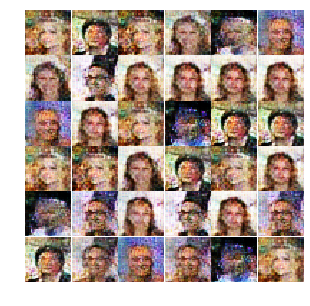

Epoch 26550/30000... Discriminator Loss: 0.3289... Generator Loss: 6.2370
Epoch 26600/30000... Discriminator Loss: 0.3336... Generator Loss: 5.8519
Epoch 26650/30000... Discriminator Loss: 0.3304... Generator Loss: 6.6327
Epoch 26700/30000... Discriminator Loss: 0.3337... Generator Loss: 6.7489
Epoch 26750/30000... Discriminator Loss: 0.3275... Generator Loss: 6.7741
Epoch 26800/30000... Discriminator Loss: 0.3269... Generator Loss: 6.7203
Epoch 26850/30000... Discriminator Loss: 0.3273... Generator Loss: 6.8976
Epoch 26900/30000... Discriminator Loss: 0.3276... Generator Loss: 6.8431
Epoch 26950/30000... Discriminator Loss: 0.3293... Generator Loss: 6.4906
Epoch 27000/30000... Discriminator Loss: 0.3267... Generator Loss: 7.0674


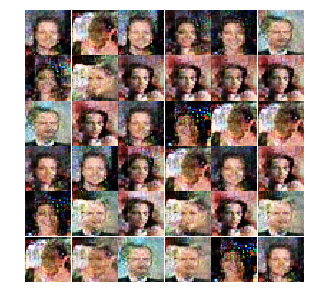

Epoch 27050/30000... Discriminator Loss: 0.3279... Generator Loss: 7.2312
Epoch 27100/30000... Discriminator Loss: 0.3281... Generator Loss: 7.5200
Epoch 27150/30000... Discriminator Loss: 0.3297... Generator Loss: 7.5615
Epoch 27200/30000... Discriminator Loss: 0.3270... Generator Loss: 7.7226
Epoch 27250/30000... Discriminator Loss: 0.3278... Generator Loss: 7.0280
Epoch 27300/30000... Discriminator Loss: 0.3301... Generator Loss: 7.4958
Epoch 27350/30000... Discriminator Loss: 0.3305... Generator Loss: 6.4398
Epoch 27400/30000... Discriminator Loss: 0.3276... Generator Loss: 7.4568
Epoch 27450/30000... Discriminator Loss: 0.3316... Generator Loss: 7.1297
Epoch 27500/30000... Discriminator Loss: 0.3270... Generator Loss: 7.7593


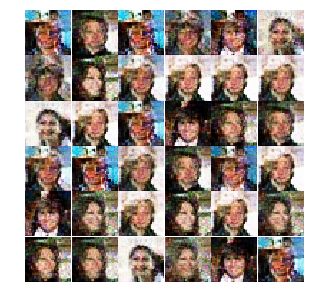

Epoch 27550/30000... Discriminator Loss: 0.3269... Generator Loss: 7.7982
Epoch 27600/30000... Discriminator Loss: 0.3276... Generator Loss: 7.5318
Epoch 27650/30000... Discriminator Loss: 0.3274... Generator Loss: 7.7190
Epoch 27700/30000... Discriminator Loss: 0.3276... Generator Loss: 7.3320
Epoch 27750/30000... Discriminator Loss: 0.3381... Generator Loss: 4.8532
Epoch 27800/30000... Discriminator Loss: 0.3317... Generator Loss: 5.3410
Epoch 27850/30000... Discriminator Loss: 0.3316... Generator Loss: 5.4006
Epoch 27900/30000... Discriminator Loss: 0.3284... Generator Loss: 6.3799
Epoch 27950/30000... Discriminator Loss: 0.3280... Generator Loss: 6.4971
Epoch 28000/30000... Discriminator Loss: 0.3312... Generator Loss: 6.9415


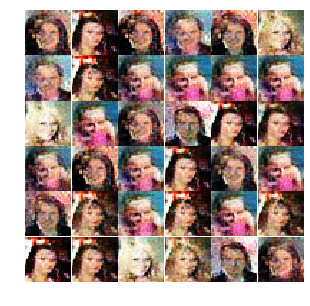

Epoch 28050/30000... Discriminator Loss: 0.3273... Generator Loss: 7.1307
Epoch 28100/30000... Discriminator Loss: 0.3272... Generator Loss: 6.6659
Epoch 28150/30000... Discriminator Loss: 0.3280... Generator Loss: 6.6788
Epoch 28200/30000... Discriminator Loss: 0.3291... Generator Loss: 6.1622
Epoch 28250/30000... Discriminator Loss: 0.3269... Generator Loss: 7.2125
Epoch 28300/30000... Discriminator Loss: 0.3273... Generator Loss: 6.8883
Epoch 28350/30000... Discriminator Loss: 0.3264... Generator Loss: 7.0534
Epoch 28400/30000... Discriminator Loss: 0.3264... Generator Loss: 7.2805
Epoch 28450/30000... Discriminator Loss: 0.3293... Generator Loss: 6.6773
Epoch 28500/30000... Discriminator Loss: 0.3346... Generator Loss: 6.2833


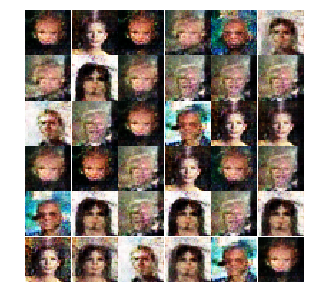

Epoch 28550/30000... Discriminator Loss: 0.3296... Generator Loss: 6.7894
Epoch 28600/30000... Discriminator Loss: 0.3267... Generator Loss: 7.8639
Epoch 28650/30000... Discriminator Loss: 0.3343... Generator Loss: 6.8307
Epoch 28700/30000... Discriminator Loss: 0.3274... Generator Loss: 7.2877
Epoch 28750/30000... Discriminator Loss: 0.3313... Generator Loss: 6.7078
Epoch 28800/30000... Discriminator Loss: 0.3268... Generator Loss: 7.1504
Epoch 28850/30000... Discriminator Loss: 0.3299... Generator Loss: 7.0665
Epoch 28900/30000... Discriminator Loss: 0.3333... Generator Loss: 7.5880
Epoch 28950/30000... Discriminator Loss: 0.3289... Generator Loss: 7.4678
Epoch 29000/30000... Discriminator Loss: 0.3277... Generator Loss: 7.8167


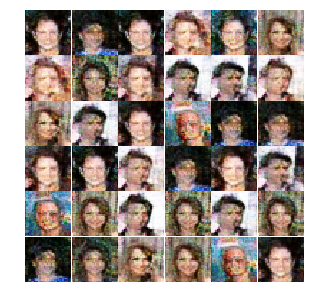

Epoch 29050/30000... Discriminator Loss: 0.3337... Generator Loss: 7.4806
Epoch 29100/30000... Discriminator Loss: 0.3269... Generator Loss: 7.7312
Epoch 29150/30000... Discriminator Loss: 0.3259... Generator Loss: 8.0649
Epoch 29200/30000... Discriminator Loss: 0.3268... Generator Loss: 7.6394
Epoch 29250/30000... Discriminator Loss: 0.3266... Generator Loss: 8.1233
Epoch 29300/30000... Discriminator Loss: 0.3277... Generator Loss: 7.6230
Epoch 29350/30000... Discriminator Loss: 0.3285... Generator Loss: 7.8288
Epoch 29400/30000... Discriminator Loss: 0.3277... Generator Loss: 7.5340
Epoch 29450/30000... Discriminator Loss: 0.3273... Generator Loss: 7.9190
Epoch 29500/30000... Discriminator Loss: 0.3348... Generator Loss: 7.1514


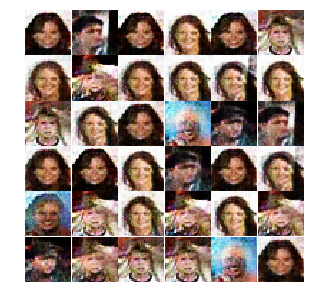

Epoch 29550/30000... Discriminator Loss: 0.3281... Generator Loss: 7.3044
Epoch 29600/30000... Discriminator Loss: 0.3282... Generator Loss: 6.9515
Epoch 29650/30000... Discriminator Loss: 0.3275... Generator Loss: 6.6647
Epoch 29700/30000... Discriminator Loss: 0.3280... Generator Loss: 7.1372
Epoch 29750/30000... Discriminator Loss: 0.3468... Generator Loss: 7.5435
Epoch 29800/30000... Discriminator Loss: 0.3323... Generator Loss: 6.3634
Epoch 29850/30000... Discriminator Loss: 0.3266... Generator Loss: 7.3599
Epoch 29900/30000... Discriminator Loss: 0.3316... Generator Loss: 6.8401
Epoch 29950/30000... Discriminator Loss: 0.3304... Generator Loss: 7.4345
Epoch 30000/30000... Discriminator Loss: 0.3306... Generator Loss: 7.4219


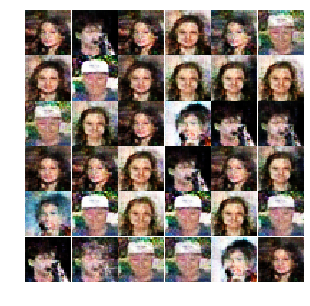

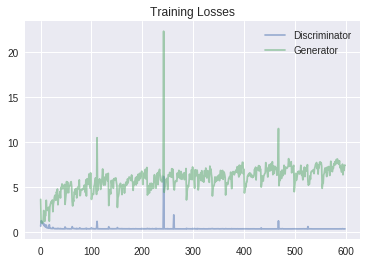

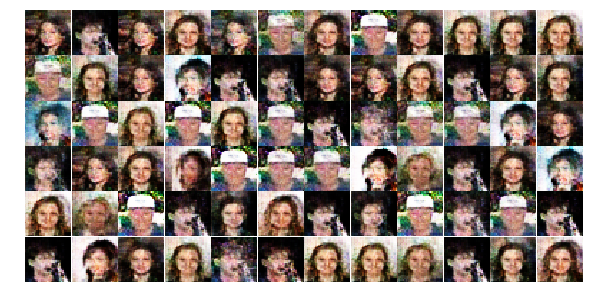

In [23]:
def train(net, dataset, epochs, batch_size, print_every=50, show_every=500, figsize=(10, 5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.normal(0, 0.816496580927726, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                        generator(net.input_z, 3, reuse=True, training=False),
                        feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 6, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pickle.dump(samples, f)

    return losses, samples


real_size = (32,32,3)
z_size = 100
learning_rate_d = 0.0002
learning_rate_g = 0.0003
batch_size = 128
epochs = 30000
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate_d, learning_rate_g, alpha=alpha, beta1=beta1)

dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(5,5))

fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

plt.show()
